# Cubic Bezier Optimization

Optimizes a cubic bezier curved-line path from a point on the viable brain surface region to a point on the subthalamic nucleus (STN) for DBS electrode planning.

Treats the following as obstacles:
- Sulci
- Ventricles
- Corpus Callosum (prevent brain crossing)

**Objective Functions**
- Distance to obstacles
- Minimum path distance  *(not optimized yet)*

## 1. Setup

### Import Libraries

In [5]:
import os
import glob
import random
import numpy as np
import pandas as pd

import vedo
from vedo import Volume, show, Line, merge, Plotter, Points

from scipy.optimize import minimize

### Configuration and Setup

In [6]:
# Define new base directory and sub-folder structure
base_dir = "./FINAL_BRAIN_ATLAS/final_nii_files"

# Entry zones (viable surface regions for path start)
entry_zone_dir = os.path.join(base_dir, "entry_zone")
left_entry_zone_dir = os.path.join(entry_zone_dir, "LEFT_ENTRY_ZONE")
right_entry_zone_dir = os.path.join(entry_zone_dir, "RIGHT_ENTRY_ZONE")

# Subthalamic nucleus (targets)
stn_root_dir = os.path.join(base_dir, "subthalamic_nucleus")
left_stn_dir = os.path.join(stn_root_dir, "LEFT_STN")
right_stn_dir = os.path.join(stn_root_dir, "RIGHT_STN")

# Full brain (for context / outline only)
full_brain_dir = os.path.join(base_dir, "full_brain")

# Obstacles (same role as before)
obstacles_dir = os.path.join(base_dir, "obstacles")

print("Base directory:", base_dir)


Base directory: ./FINAL_BRAIN_ATLAS/final_nii_files


### Load Brain Structures

Recursively load all `.nii` / `.nii.gz` files under each designated root:
- Entry Zones (LEFT/RIGHT) viable start regions (light brown, low alpha)
- STN Targets (LEFT/RIGHT) (distinct greens)
- Obstacles (red)
- Full Brain outline (very light grey, minimal alpha)

All subfolder contents are merged later per category.

In [7]:
# Initialize lists for different structure types
left_entry_zone_structures = []
right_entry_zone_structures = []
left_stn_structures = []
right_stn_structures = []
obstacle_structures = []
full_brain_structures = []

# Loader utility: walk all subfolders and load every .nii / .nii.gz
def load_folder_surfaces(root_folder, color, alpha=1.0):
    loaded = []
    if not os.path.isdir(root_folder):
        print(f"[WARN] Folder not found: {root_folder}")
        return loaded
    for dirpath, dirnames, filenames in os.walk(root_folder):
        nii_files = [f for f in filenames if f.lower().endswith('.nii') or f.lower().endswith('.nii.gz')]
        for fname in nii_files:
            fpath = os.path.join(dirpath, fname)
            rel = os.path.relpath(fpath, root_folder)
            print(f"  Loading structure: {rel}")
            vol = Volume(fpath)
            surf = vol.isosurface()
            surf.c(color).alpha(alpha)
            loaded.append(surf)
    if not loaded:
        print(f"  [INFO] No NIfTI files found under {root_folder}")
    return loaded

print("\nLoading Entry Zones (LEFT)...")
left_entry_zone_structures = load_folder_surfaces(left_entry_zone_dir, color=(0.95, 0.65, 0.85), alpha=0.04)
print("Loading Entry Zones (RIGHT)...")
right_entry_zone_structures = load_folder_surfaces(right_entry_zone_dir, color=(0.95, 0.75, 0.85), alpha=0.04)

# STN folders (may already be deepest; recursion still safe)
print("\nLoading STN (LEFT)...")
left_stn_structures = load_folder_surfaces(left_stn_dir, color="green", alpha=1.0)
print("Loading STN (RIGHT)...")
right_stn_structures = load_folder_surfaces(right_stn_dir, color="green", alpha=1.0)

print("\nLoading Obstacles...")
obstacle_structures = load_folder_surfaces(obstacles_dir, color="red", alpha=0.7)

print("\nLoading Full Brain Outline...")
full_brain_structures = load_folder_surfaces(full_brain_dir, color="grey", alpha=0.01)



Loading Entry Zones (LEFT)...
  Loading structure: LEFT_FRONTAL_LOBE/Model_1017_left_paracentral_lobule.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1028_left_superior_frontal_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1027_anterior_part_of_left_middle_frontal_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1020_triangular_part_of_left_inferior_frontal_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1003_posterior_part_of_left_middle_frontal_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1024_left_precentral_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1018_opercular_part_of_left_inferior_frontal_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1012_left_lateral_orbital_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1032_left_frontal_pole.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1014_left_straight_gyrus.nii
  Loading structure: LEFT_FRONTAL_LOBE/Model_1019_orbital_part_of_left_inferior_frontal_gyrus.nii
  Loading st

### Merge Structures

Combine individual structures into single meshes for:
- LEFT/RIGHT Entry Zones (start sampling)
- LEFT/RIGHT STN (target sampling hemisphere-consistent)
- Obstacles (for intersection & distance)
- Full Brain (context outline only)


In [8]:
# Merge structures into single meshes
merged_left_entry_zone = merge(left_entry_zone_structures) if left_entry_zone_structures else None
if merged_left_entry_zone: merged_left_entry_zone.alpha(0.04)

merged_right_entry_zone = merge(right_entry_zone_structures) if right_entry_zone_structures else None
if merged_right_entry_zone: merged_right_entry_zone.alpha(0.04)

merged_left_stn = merge(left_stn_structures) if left_stn_structures else None
merged_right_stn = merge(right_stn_structures) if right_stn_structures else None

merged_obstacles = merge(obstacle_structures) if obstacle_structures else None
if merged_obstacles: merged_obstacles.c("blue").alpha(0.07)

merged_full_brain = merge(full_brain_structures) if full_brain_structures else None
if merged_full_brain: merged_full_brain.c("grey").alpha(0.01)

print("\nMerged Summary:")
print(f"  Left Entry Zone: {'yes' if merged_left_entry_zone else 'no'}")
print(f"  Right Entry Zone: {'yes' if merged_right_entry_zone else 'no'}")
print(f"  Left STN: {'yes' if merged_left_stn else 'no'}")
print(f"  Right STN: {'yes' if merged_right_stn else 'no'}")
print(f"  Obstacles: {'yes' if merged_obstacles else 'no'}")
print(f"  Full Brain: {'yes' if merged_full_brain else 'no'}")



Merged Summary:
  Left Entry Zone: yes
  Right Entry Zone: yes
  Left STN: yes
  Right STN: yes
  Obstacles: yes
  Full Brain: yes


### Helper Functions

In [9]:
def compute_path_length(start_point, end_point):
    """Compute the distance between two points for the line path."""
    return np.linalg.norm(np.array(end_point) - np.array(start_point))


def compute_obstacle_distance(start_point, end_point):
    """Compute the minimum distance from the line path to any obstacle."""
    if merged_obstacles is None:
        return 0.0
    temp_line = Line([start_point, end_point])
    d = temp_line.distance_to(merged_obstacles)
    if isinstance(d, (list, tuple, np.ndarray)):
        return float(np.min(d))
    return float(d)


def check_intersection(start_point, end_point):
    """Check if the line path intersects any obstacle."""
    if merged_obstacles is None:
        return False
    intersections = merged_obstacles.intersect_with_line(start_point, end_point)
    return intersections is not None and len(intersections) > 0


def _closest_point_on_mesh(point, mesh):
    """Project a 3D point onto the closest point on a mesh surface."""
    if mesh is None:
        return tuple(point)
    try:
        cp = mesh.closest_point(point)
        return tuple(cp)
    except Exception:
        # Fallback to nearest vertex
        verts = np.asarray(mesh.vertices)
        if verts.size == 0:
            return tuple(point)
        idx = int(np.argmin(np.linalg.norm(verts - np.asarray(point), axis=1)))
        return tuple(verts[idx])


def project_to_surfaces(start_point, end_point, hemisphere):
    """Project start/end onto entry zone and STN surfaces for the chosen hemisphere."""
    if hemisphere == 'left':
        sp = _closest_point_on_mesh(start_point, merged_left_entry_zone)
        ep = _closest_point_on_mesh(end_point, merged_left_stn)
    else:
        sp = _closest_point_on_mesh(start_point, merged_right_entry_zone)
        ep = _closest_point_on_mesh(end_point, merged_right_stn)
    return sp, ep


def sample_start_and_end():
    """Sample a hemisphere-consistent start (entry zone) and end (STN)."""
    hemispheres = []
    if merged_left_entry_zone and merged_left_stn:
        hemispheres.append('left')
    if merged_right_entry_zone and merged_right_stn:
        hemispheres.append('right')
    if not hemispheres:
        raise RuntimeError("No valid hemisphere data available for sampling.")
    hemi = random.choice(hemispheres)
    if hemi == 'left':
        start = tuple(merged_left_entry_zone.generate_random_points(1).points[0])
        end = tuple(merged_left_stn.generate_random_points(1).points[0])
    else:
        start = tuple(merged_right_entry_zone.generate_random_points(1).points[0])
        end = tuple(merged_right_stn.generate_random_points(1).points[0])
    return hemi, start, end


## NEW: Cubic Bezier Function


### Helper Functions

In [10]:
def propose_control_points(start, end):
    start = np.array(start)
    end = np.array(end)
    d = end - start
    d_norm = d / np.linalg.norm(d)

    # perpendicular vector
    tmp = np.random.randn(3)
    perp = tmp - np.dot(tmp, d_norm)*d_norm
    perp /= np.linalg.norm(perp)

    alpha = np.random.uniform(0.1, 0.4)
    gamma = np.random.uniform(0.6, 0.9)
    beta = np.random.uniform(0, 25.0)  # mm

    P1 = start + alpha * d + beta * perp
    P2 = start + gamma * d - beta * perp

    return P1, P2

def sample_bezier_points(start_point, control_point1, control_point2, end_point, num_samples=100):
    # sample points along 3d cubic bezier curve
    P0 = np.asarray(start_point, dtype=float)
    P1 = np.asarray(control_point1, dtype=float)
    P2 = np.asarray(control_point2, dtype=float)
    P3 = np.asarray(end_point, dtype=float)

    t = np.linspace(0.0, 1.0, num_samples)
    one_minus_t = 1.0 - t

    pts = (
        (one_minus_t**3)[:, None] * P0 +
        (3 * one_minus_t**2 * t)[:, None] * P1 +
        (3 * one_minus_t * t**2)[:, None] * P2 +
        (t**3)[:, None] * P3
    )
    return pts

def compute_obstacle_distance_bezier(start_point, end_point, control_point1, control_point2, num_samples=100):
    # calculate the minimum distance from the cubic bezier path to any obstacle
    if merged_obstacles is None:
        return 0.0

    pts = sample_bezier_points(start_point, control_point1, control_point2, end_point, num_samples=num_samples)
    curve_pts = Points(pts)

    d = curve_pts.distance_to(merged_obstacles)
    if isinstance(d, (list, tuple, np.ndarray)):
        return float(np.min(d))
    return float(d)

def check_intersection_bezier(start_point, end_point, control_point1, control_point2, num_samples=100):
    """
    1. check if the cubic bezier path intersects any obstacle, and
    2. approximates curve with short line segments and tests each segment.
    """
    if merged_obstacles is None:
        return False

    pts = sample_bezier_points(start_point, control_point1, control_point2, end_point, num_samples=num_samples)

    # check each segment along the curve
    for i in range(len(pts) - 1):
        p0 = pts[i]
        p1 = pts[i + 1]
        intersections = merged_obstacles.intersect_with_line(p0, p1)
        if intersections is not None and len(intersections) > 0:
            return True

    return False


### Create Bezier Path and Compute Length

In [11]:
def compute_bezier_path_length(
    start_point,
    end_point,
    control_point1,
    control_point2,
    min_radius_mm=None,
    num_samples=1000,
):
    """
    compute length of 3d cubic bezeier curve btw start_point and end_point

    calculate p1 p2 from propose_control_points helper function

    """
    P0 = np.asarray(start_point, dtype=float)
    P1 = np.asarray(control_point1, dtype=float)
    P2 = np.asarray(control_point2, dtype=float)
    P3 = np.asarray(end_point, dtype=float)

    t = np.linspace(0.0, 1.0, num_samples)

    def bezier_pos(t):
        one_minus_t = 1.0 - t
        return (
            (one_minus_t**3)[:, None] * P0 +
            (3 * one_minus_t**2 * t)[:, None] * P1 +
            (3 * one_minus_t * t**2)[:, None] * P2 +
            (t**3)[:, None] * P3
        )

    # first derivative B'(t)
    def bezier_first_derivative(t):
        one_minus_t = 1.0 - t
        return (
            (3 * one_minus_t**2)[:, None] * (P1 - P0) +
            (6 * one_minus_t * t)[:, None] * (P2 - P1) +
            (3 * t**2)[:, None] * (P3 - P2)
        )

    # secibd derivative B''(t)
    def bezier_second_derivative(t):
        return (
            (6 * (1.0 - t))[:, None] * (P2 - 2*P1 + P0) +
            (6 * t)[:, None] * (P3 - 2*P2 + P1)
        )

    pts = bezier_pos(t) #sample curve

    # approx. length
    diffs = np.diff(pts, axis=0)
    segment_lengths = np.linalg.norm(diffs, axis=1)
    length = float(np.sum(segment_lengths))

    # electrode needle curvature constraint
    if min_radius_mm is not None:
        t_mid = t[1:-1]
        B1 = bezier_first_derivative(t_mid)
        B2 = bezier_second_derivative(t_mid)

        # curvature k(t) = ||B'(t) x B''(t)|| / ||B'(t)||^3
        cross = np.cross(B1, B2)
        num = np.linalg.norm(cross, axis=1)
        denom = np.linalg.norm(B1, axis=1)**3

        with np.errstate(divide='ignore', invalid='ignore'):
            curvature = np.where(denom > 0, num / denom, 0.0)

        # radius of curvature R(t) = 1 / k(t) --> if straight, R(t) = inf
        radius = np.where(curvature > 0, 1.0 / curvature, np.inf)

        min_radius_on_curve = np.min(radius)

        if min_radius_on_curve < min_radius_mm:
            print(f"Curvature constraint violated: minimum radius along curve ")
            print(f"is {min_radius_on_curve:.3f} mm, required >= {min_radius_mm:.3f} mm.")
            return None 

    return length



### Bezier Draw Line for Visualization TEST

In [12]:
safe_path_lines = []
collided_path_lines = []

ESTIMATION_SAMPLES = 100
R_MIN_MM = 40.0  # min radius of curvature

sample_obstacle_dists = []
sample_path_lengths = []
collided_path_lengths = []

print("Estimating normalization constants from random samples...")

for i in range(ESTIMATION_SAMPLES):
    print(f"Sampling path {i+1}/{ESTIMATION_SAMPLES}...")
    hemi, start, end = sample_start_and_end()

    P1, P2 = propose_control_points(start, end)
    path_length = compute_bezier_path_length(
        start_point=start,
        end_point=end,
        control_point1=P1,
        control_point2=P2,
        min_radius_mm=R_MIN_MM,
    )

    if path_length is None: # skip paths that violate curavture (too sharp bend)
        print(f"Skipping path: violates curvature constraint")
        continue

    pts = sample_bezier_points(start, P1, P2, end, num_samples=100)

    if check_intersection_bezier(start, end, P1, P2, num_samples=100): # collision check
        print(f"Path intersects obstacles, adding to collided_path_lengths...")
        collided_path_lengths.append(path_length)

        line_actor = Line(pts).c("red").alpha(0.3).linewidth(4) # red for coliision lines
        collided_path_lines.append(line_actor)

    else:
        sample_path_lengths.append(path_length)

        line_actor = Line(pts).c("green").alpha(0.6).linewidth(6) # green for safe lines
        safe_path_lines.append(line_actor)


Estimating normalization constants from random samples...
Sampling path 1/100...
Curvature constraint violated: minimum radius along curve 
is 7.188 mm, required >= 40.000 mm.
Skipping path: violates curvature constraint
Sampling path 2/100...
Curvature constraint violated: minimum radius along curve 
is 5.843 mm, required >= 40.000 mm.
Skipping path: violates curvature constraint
Sampling path 3/100...
Curvature constraint violated: minimum radius along curve 
is 7.350 mm, required >= 40.000 mm.
Skipping path: violates curvature constraint
Sampling path 4/100...
Curvature constraint violated: minimum radius along curve 
is 12.369 mm, required >= 40.000 mm.
Skipping path: violates curvature constraint
Sampling path 5/100...
Curvature constraint violated: minimum radius along curve 
is 16.590 mm, required >= 40.000 mm.
Skipping path: violates curvature constraint
Sampling path 6/100...
Curvature constraint violated: minimum radius along curve 
is 6.166 mm, required >= 40.000 mm.
Skippin

### Display Length of Safe and Collided Paths

In [13]:
df1 = pd.DataFrame({"Sample Path Lengths (mm)": sample_path_lengths})
df2 = pd.DataFrame({"Collided Path Lengths (mm)": collided_path_lengths})

print("PATH LENGTH: ", len(sample_path_lengths))
print(df1)

print("COLLIDED PATH LENGTH: ", len(collided_path_lengths))
print(df2)

PATH LENGTH:  8
   Sample Path Lengths (mm)
0                 79.556227
1                 51.995817
2                 56.732853
3                 63.360394
4                 69.977195
5                 62.596713
6                 68.259012
7                 54.700145
COLLIDED PATH LENGTH:  2
   Collided Path Lengths (mm)
0                   58.479806
1                   63.168718


### Visualization (Test)

Rendering scene...


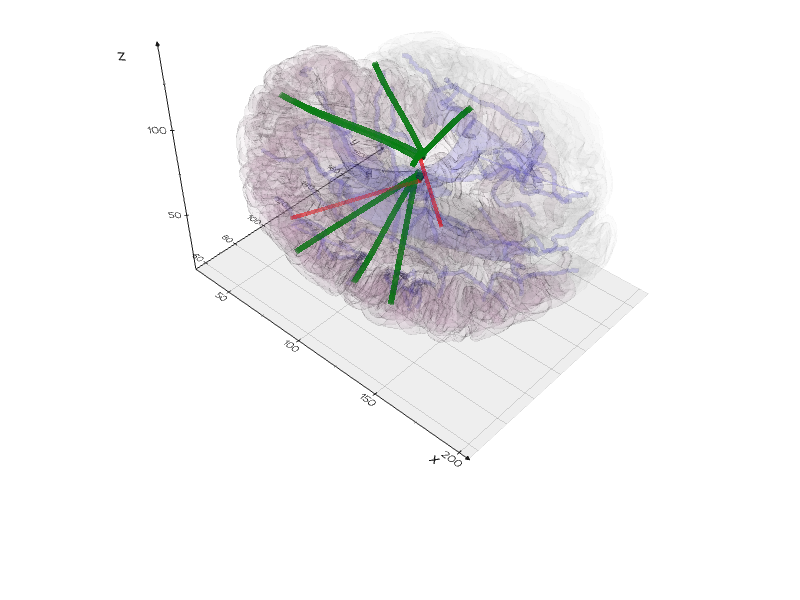

In [14]:
actors = []
if merged_full_brain: actors.append(merged_full_brain)

selected_hemisphere = 'both'

if selected_hemisphere == 'left':
    if merged_left_entry_zone:
        actors.append(merged_left_entry_zone.clone().alpha(0.08))
    if merged_right_entry_zone:
        actors.append(merged_right_entry_zone.clone().alpha(0.02))
    if merged_left_stn:
        actors.append(merged_left_stn.clone().alpha(0.9))
    if merged_right_stn:
        actors.append(merged_right_stn.clone().alpha(0.3))
elif selected_hemisphere == 'right':
    if merged_left_entry_zone:
        actors.append(merged_left_entry_zone.clone().alpha(0.02))
    if merged_right_entry_zone:
        actors.append(merged_right_entry_zone.clone().alpha(0.08))
    if merged_left_stn:
        actors.append(merged_left_stn.clone().alpha(0.3))
    if merged_right_stn:
        actors.append(merged_right_stn.clone().alpha(0.9))
else:
    if merged_left_entry_zone: actors.append(merged_left_entry_zone)
    if merged_right_entry_zone: actors.append(merged_right_entry_zone)
    if merged_left_stn: actors.append(merged_left_stn)
    if merged_right_stn: actors.append(merged_right_stn)

if merged_obstacles:
    actors.append(merged_obstacles)

actors.extend(safe_path_lines)
actors.extend(collided_path_lines)

print(f"Rendering scene...")

show(
    actors,
    axes=1,
    viewup="z",
    #title=f"Optimized Path (w_obs={w_obstacle_norm:.2f}, w_len={w_path_length_norm:.2f})"
)



## 2. Monte Carlo Optimization

### Path Generation and Optimization

Generate random paths from brain surface to STN and evaluate them:
- **Orange lines**: Failed paths (intersect obstacles)
- **Yellow lines**: Successful but suboptimal paths
- **Green line**: Optimal path (maximum distance from obstacles)

**Optimization Algorithm**

Runs until finding a successful path and after a minimum of `min_attempts`.

Chooses a **random location** from the viable brain surface region and the STN of the corresponding hemisphere. 

For each plot, the distance from obstacles is saved. The "best" path is determined using the highest distance to obstacles.

In [15]:
# Configuration for Monte Carlo path generation
max_attempts = 1000
min_attempts = 100
successful_attempts = []  # Store (hemisphere, start_point, end_point, obstacle_distance, path_length) tuples
failed_lines = []

# Line width configuration (for visualization)
BEST_PATH_WIDTH = 8
SUBOPTIMAL_PATH_WIDTH = 5
FAILED_PATH_WIDTH = 5


In [16]:
# Generate and evaluate hemisphere-consistent paths
for attempt in range(max_attempts):
    if attempt + 1 > min_attempts:
        break

    hemi, start_point, end_point = sample_start_and_end()
    print(f"Attempt {attempt+1}: hemisphere={hemi} start={start_point} end={end_point}")

    # Check for intersection if we have obstacles
    if merged_obstacles:
        if not check_intersection(start_point, end_point):
            # Compute metrics
            temp_line = Line([start_point, end_point])
            obstacle_dist = compute_obstacle_distance(start_point, end_point)
            path_len = compute_path_length(start_point, end_point)
            successful_attempts.append((hemi, start_point, end_point, obstacle_dist, path_len))
            print(f"  SUCCESS - Obstacle Distance: {obstacle_dist:.3f} Path Length: {path_len:.3f}")
        else:
            failed_line = Line([start_point, end_point]).c("orange").alpha(0.3).lw(FAILED_PATH_WIDTH)
            failed_lines.append(failed_line)
            print("  FAIL - Line intersects obstacles")
    else:
        obstacle_dist = 0.0
        path_len = compute_path_length(start_point, end_point)
        successful_attempts.append((hemi, start_point, end_point, obstacle_dist, path_len))
        print(f"  SUCCESS (no obstacles) Path Length: {path_len:.3f}")
else:
    print(f"Warning: Only found {len(successful_attempts)} non-intersecting lines after {max_attempts} attempts")


Attempt 1: hemisphere=right start=(np.float32(64.53711), np.float32(121.0), np.float32(116.24316)) end=(np.float32(106.75), np.float32(131.26047), np.float32(84.36228))
  SUCCESS - Obstacle Distance: 5.954 Path Length: 53.885
Attempt 2: hemisphere=left start=(np.float32(119.64986), np.float32(82.39986), np.float32(29.758053)) end=(np.float32(109.25), np.float32(131.24348), np.float32(72.92452))
  SUCCESS - Obstacle Distance: 2.764 Path Length: 66.009
Attempt 3: hemisphere=right start=(np.float32(111.47402), np.float32(91.98485), np.float32(137.95888)) end=(np.float32(106.75), np.float32(131.55972), np.float32(84.13621))
  SUCCESS - Obstacle Distance: 5.923 Path Length: 66.973
Attempt 4: hemisphere=right start=(np.float32(54.299458), np.float32(120.66031), np.float32(106.25)) end=(np.float32(107.5469), np.float32(132.20592), np.float32(84.59097))
  SUCCESS - Obstacle Distance: 6.646 Path Length: 58.632
Attempt 5: hemisphere=right start=(np.float32(105.5), np.float32(73.64774), np.float3

### Select Optimal Path

Find the best path among successful attempts by maximizing distance from obstacles.

In [17]:
# Select best path (maximum obstacle distance; tie-breaker shorter path length)
best_path = None
suboptimal_lines = []
selected_hemisphere = None

if successful_attempts:
    # Sort: first by obstacle distance desc, then by path length asc
    successful_attempts.sort(key=lambda x: (-x[3], x[4]))

    best_hemi, best_start, best_end, best_obstacle_dist, best_path_len = successful_attempts[0]
    best_path = Line([best_start, best_end]).c("green").lw(BEST_PATH_WIDTH)
    selected_hemisphere = best_hemi
    print(f"\nBest path: hemisphere={best_hemi} obstacle_dist={best_obstacle_dist:.3f} path_len={best_path_len:.3f}")

    max_suboptimal_paths = 10
    s = 1
    for hemi, start_pt, end_pt, obstacle_dist, path_len in successful_attempts[1:]:
        if s > max_suboptimal_paths:
            break
        
        suboptimal_line = Line([start_pt, end_pt]).c("yellow").alpha(0.3).lw(SUBOPTIMAL_PATH_WIDTH)
        suboptimal_lines.append(suboptimal_line)
        print(f"Suboptimal path {s}: hemi={hemi} obstacle_dist={obstacle_dist:.3f} path_len={path_len:.3f}")
        
        s += 1
else:
    print("No successful paths found!")



Best path: hemisphere=right obstacle_dist=7.132 path_len=69.969
Suboptimal path 1: hemi=right obstacle_dist=7.093 path_len=66.420
Suboptimal path 2: hemi=right obstacle_dist=7.074 path_len=76.970
Suboptimal path 3: hemi=right obstacle_dist=6.963 path_len=75.458
Suboptimal path 4: hemi=right obstacle_dist=6.706 path_len=78.515
Suboptimal path 5: hemi=right obstacle_dist=6.646 path_len=58.632
Suboptimal path 6: hemi=right obstacle_dist=6.629 path_len=50.994
Suboptimal path 7: hemi=right obstacle_dist=6.420 path_len=47.955
Suboptimal path 8: hemi=right obstacle_dist=6.326 path_len=67.514
Suboptimal path 9: hemi=right obstacle_dist=6.185 path_len=71.750
Suboptimal path 10: hemi=right obstacle_dist=6.073 path_len=71.254


## 3. Weighted Sum + Nelder-Mead Optimization

### Configuration

Set weights and optimization parameters:
- `w_obstacle`: Weight for obstacle distance (maximize)
- `w_path_length`: Weight for path length (minimize)
- Weights are normalized automatically

In [18]:
# Weights for multi-objective optimization (easily configurable)
w_obstacle = 0.9     # Weight for obstacle distance (higher = prefer safer paths)
w_path_length = 0.1   # Weight for path length (higher = prefer shorter paths)

# Normalize weights to sum to 1
total_weight = w_obstacle + w_path_length
w_obstacle_norm = w_obstacle / total_weight
w_path_length_norm = w_path_length / total_weight

print(f"Objective function weights:\n  Obstacle distance: {w_obstacle_norm:.3f}\n  Path length: {w_path_length_norm:.3f}")

# Nelder-Mead parameters
initial_point_attempts = 50
nm_max_iterations = 20000
nm_tolerance = 1e-6  # default: 1e-6, applied as xatol and fatol

# Hemisphere lock for optimization (set later when picking x0)
nm_hemisphere = None


Objective function weights:
  Obstacle distance: 0.900
  Path length: 0.100


### Weighted Sum Objective Function

Combines both objectives (obstacle distance and path length) into a single scalar value for optimization.

In [19]:
### CUBIC BEZIER

max_obstacle_dist = None
max_path_length = None

last_eval = {
    "x": None,
    "start": None,
    "end": None,
    "P1": None,
    "P2": None,
    "path_points": None,
    "objective": None,
}

all_evals = []

def weighted_sum_objective(x):
    global nm_hemisphere, last_eval, all_eval
    
    start_guess = tuple(x[:3])
    end_guess   = tuple(x[3:])

    if nm_hemisphere is None:
        nm_hemisphere = 'left' if merged_left_entry_zone and merged_left_stn else 'right'

    start_point, end_point = project_to_surfaces(start_guess, end_guess, nm_hemisphere)

    P1, P2 = propose_control_points(start_point, end_point)

    path_length = compute_bezier_path_length(
        start_point=start_point,
        end_point=end_point,
        control_point1=P1,
        control_point2=P2,
        min_radius_mm=R_MIN_MM,
    )
    if path_length is None:
        return 1e10

    if check_intersection_bezier(start_point, end_point, P1, P2):
        return 1e10

    obstacle_dist = compute_obstacle_distance_bezier(start_point, end_point, P1, P2)

    norm_obstacle_dist = obstacle_dist / (max_obstacle_dist or 100.0)
    norm_path_length   = path_length   / (max_path_length   or 200.0)

    objective = -w_obstacle_norm * norm_obstacle_dist + w_path_length_norm * norm_path_length

    path_points = sample_bezier_points(start_point, end_point, P1, P2, num_samples=200)

    last_eval.update({
        "x": x.copy(),
        "start": start_point,
        "end": end_point,
        "P1": P1,
        "P2": P2,
        "path_points": path_points,
        "objective": objective,
    })

    all_evals.append(last_eval.copy())
    
    return objective


### IGNORED: Estimate Normalization Constants

Sample a few random paths to estimate typical ranges for obstacle distance and path length.

In [1]:
ESTIMATION_SAMPLES = 100

In [ ]:
# Sample random paths to estimate normalization constants
print("Estimating normalization constants from random samples...")
sample_obstacle_dists = []
sample_path_lengths = []

for _ in range(ESTIMATION_SAMPLES):
    print(f"Sampling path {_+1}/{ESTIMATION_SAMPLES}...")
    hemi, start, end = sample_start_and_end()
    if not check_intersection(start, end):
        obstacle_dist = compute_obstacle_distance(start, end)
        path_length = compute_path_length(start, end)
        sample_obstacle_dists.append(obstacle_dist)
        sample_path_lengths.append(path_length)
        # print(f"  obstacle_dist={obstacle_dist:.3f} path_len={path_length:.3f}")
    else:
        print("  Sampled path intersects obstacles, skipping...")

if sample_obstacle_dists:
    max_obstacle_dist = max(sample_obstacle_dists)
    max_path_length = max(sample_path_lengths)
    print(f"Estimated max obstacle distance: {max_obstacle_dist:.2f}")
    print(f"Estimated max path length: {max_path_length:.2f}")
else:
    print("Warning: No valid paths found for normalization, using defaults")
    max_obstacle_dist = 8
    max_path_length = 100


In [ ]:
## OPTION 2: Use Monte Carlo results for normalization (if available)
if successful_attempts:
    print("\nUsing Monte Carlo results for normalization...")
    mc_obstacle_dists = [x[3] for x in successful_attempts]
    mc_path_lengths = [x[4] for x in successful_attempts]
    max_obstacle_dist = max(mc_obstacle_dists)
    max_path_length = max(mc_path_lengths)
    print(f"Max obstacle distance from Monte Carlo: {max_obstacle_dist:.2f}")
    print(f"Max path length from Monte Carlo: {max_path_length:.2f}")
else:
    print("\nNo Monte Carlo results available for normalization, using defaults")
    max_obstacle_dist = 8
    max_path_length = 100



Using Monte Carlo results for normalization...
Max obstacle distance from Monte Carlo: 7.17
Max path length from Monte Carlo: 90.09


### Set Initial Path for Optimization 

In [20]:
## OPTION 1: Find first feasible initial point from random sampling
print("\nFinding feasible initial point...")
x0 = None
for attempt in range(initial_point_attempts):
    hemi, start, end = sample_start_and_end()
    if not check_intersection(start, end):
        x0 = np.concatenate([start, end])
        nm_hemisphere = hemi  # lock hemisphere for optimization
        print(f"Found feasible starting point after {attempt+1} attempts (hemi={hemi})")
        print(f"  Start: {start}")
        print(f"  End: {end}")
        break

if x0 is None:
    print("Warning: Could not find feasible starting point, using last sampled anyway")
    hemi, start, end = sample_start_and_end()
    x0 = np.concatenate([start, end])
    nm_hemisphere = hemi


Finding feasible initial point...
Found feasible starting point after 1 attempts (hemi=left)
  Start: (np.float32(43.975605), np.float32(116.81087), np.float32(40.085262))
  End: (np.float32(106.06536), np.float32(130.85214), np.float32(73.9175))


In [21]:
## OPTION 2: Select best Monte Carlo path as starting point (if available)
if successful_attempts:
    best_hemi, best_start, best_end, best_obstacle_dist, best_path_len = successful_attempts[0]
    print("\nUsing best Monte Carlo path as initial point for optimization...")
    x0 = np.concatenate([best_start, best_end])
    nm_hemisphere = best_hemi
    selected_hemisphere = best_hemi
else:
    print("\nNo Monte Carlo successful paths available; retaining previous x0 and hemisphere.")


Using best Monte Carlo path as initial point for optimization...


### Run Nelder-Mead Optimization

Use Nelder-Mead simplex algorithm to optimize the weighted sum objective. Starts from a random feasible point.

In [22]:
# --- OPTIMIZATION: run Nelder-Mead ---

print("STARTING CUBIC BEZIER")
print(f"\nRunning Nelder-Mead optimization (hemi={nm_hemisphere})...")
print(f"  Max iterations: {nm_max_iterations}")
print(f"  Tolerance: {nm_tolerance}")

result = minimize(
    weighted_sum_objective,
    x0,
    method='Nelder-Mead',
    options={
        'maxiter': nm_max_iterations,
        'xatol': nm_tolerance,
        'fatol': nm_tolerance,
        'disp': True,
    },
)

optimal_curve_points = last_eval["path_points"]


raw_start = tuple(result.x[:3])
raw_end = tuple(result.x[3:])
nm_optimal_start, nm_optimal_end = project_to_surfaces(raw_start, raw_end, nm_hemisphere)
nm_optimal_objective = result.fun
selected_hemisphere = nm_hemisphere

print(f"\n{'='*60}")
print(f"Optimization Results:")
print(f"{'='*60}")
print(f"Success: {result.success}")
print(f"Message: {result.message}")
print(f"Iterations: {result.nit}")
print(f"Function evaluations: {result.nfev}")
print(f"Final objective value: {nm_optimal_objective:.6f}")
print(f"\nOptimal path (projected, hemi={nm_hemisphere}):")
print(f"  Start: {nm_optimal_start}")
print(f"  End:   {nm_optimal_end}")


STARTING CUBIC BEZIER

Running Nelder-Mead optimization (hemi=right)...
  Max iterations: 20000
  Tolerance: 1e-06
Curvature constraint violated: minimum radius along curve 
is 14.710 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 20.400 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 6.034 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 4.908 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 7.627 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 27.753 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 9.937 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 14.107 mm, required >= 40.000 mm.
Curvature constraint violated: minimum radius along curve 
is 25.154 mm, required >= 40.000 mm.
Curvature constraint viol

/var/folders/w8/6p25t7mj3tg3svjr2l_0qrsh0000gn/T/ipykernel_3682/3080281482.py:8: RuntimeWarning: Maximum number of iterations has been exceeded.
  result = minimize(


### Evaluate Optimal Path

Compute detailed metrics for the optimized path.

Ensure that nm_optimal_start is found in last_eval, then pull the corresponding 'P1' and 'P2' points and path_points to reconstruct the optimal path.

In [23]:
import numpy as np

def match_single_eval(last_eval, nm_optimal_start, nm_optimal_end, tol=1e-3):
    if (
        np.allclose(last_eval["start"], nm_optimal_start, atol=tol) and
        np.allclose(last_eval["end"],   nm_optimal_end,   atol=tol)
    ):
        return last_eval
    return None

match = match_single_eval(last_eval, nm_optimal_start, nm_optimal_end)

if match:
    P1_opt = match["P1"]
    P2_opt = match["P2"]
    path_points = match["path_points"]
else:
    print("No match found.")


nm_obstacle_dist = compute_obstacle_distance_bezier(
    nm_optimal_start, nm_optimal_end, P1_opt, P2_opt
)

nm_path_length = compute_bezier_path_length(
    nm_optimal_start, nm_optimal_end, P1_opt, P2_opt, min_radius_mm=R_MIN_MM
)

nm_has_intersection = check_intersection_bezier(
    nm_optimal_start, nm_optimal_end, P1_opt, P2_opt
)

print(f"\nOptimal Path Metrics (cubic Bézier):")
print(f"  Obstacle distance: {nm_obstacle_dist:.3f}")
print(f"  Intersects obsts?: {nm_has_intersection}")
print(f"  Path Length: {nm_path_length}")


nm_optimal_line = Line(path_points).c("cyan").lw(8)



Optimal Path Metrics (cubic Bézier):
  Obstacle distance: 2.113
  Intersects obsts?: False
  Path Length: 69.24697899343009


### Double check the radius of curvature (make sure it's greater than 40 mm)

In [24]:
import numpy as np

def compute_bezier_path_length(
    start_point,
    end_point,
    control_point1,
    control_point2,
    min_radius_mm=None,
    num_samples=1000,
):

    P0 = np.asarray(start_point, dtype=float)
    P1 = np.asarray(control_point1, dtype=float)
    P2 = np.asarray(control_point2, dtype=float)
    P3 = np.asarray(end_point, dtype=float)

    t = np.linspace(0.0, 1.0, num_samples)

    def bezier_pos(t):
        one_minus_t = 1.0 - t
        return (
            (one_minus_t**3)[:, None] * P0 +
            (3 * one_minus_t**2 * t)[:, None] * P1 +
            (3 * one_minus_t * t**2)[:, None] * P2 +
            (t**3)[:, None] * P3
        )

    def bezier_first_derivative(t):
        one_minus_t = 1.0 - t
        return (
            (3 * one_minus_t**2)[:, None] * (P1 - P0) +
            (6 * one_minus_t * t)[:, None] * (P2 - P1) +
            (3 * t**2)[:, None] * (P3 - P2)
        )

    def bezier_second_derivative(t):
        return (
            (6 * (1.0 - t))[:, None] * (P2 - 2*P1 + P0) +
            (6 * t)[:, None] * (P3 - 2*P2 + P1)
        )

    # sample curve
    pts = bezier_pos(t)

    diffs = np.diff(pts, axis=0)
    segment_lengths = np.linalg.norm(diffs, axis=1)
    length = float(np.sum(segment_lengths))

    min_radius_on_curve = None

    # electrode needle curvature constraint
    if min_radius_mm is not None:
        t_mid = t[1:-1]
        B1 = bezier_first_derivative(t_mid)
        B2 = bezier_second_derivative(t_mid)

        cross = np.cross(B1, B2)
        num = np.linalg.norm(cross, axis=1)
        denom = np.linalg.norm(B1, axis=1)**3

        with np.errstate(divide='ignore', invalid='ignore'):
            curvature = np.where(denom > 0, num / denom, 0.0)

        radius = np.where(curvature > 0, 1.0 / curvature, np.inf)
        min_radius_on_curve = float(np.min(radius))

        if min_radius_on_curve < min_radius_mm:
            print("Curvature constraint violated: minimum radius along curve ")
            print(
                f"is {min_radius_on_curve:.3f} mm, "
                f"required >= {min_radius_mm:.3f} mm."
            )

    return length, min_radius_on_curve

nm_path_length, nm_min_radius = compute_bezier_path_length(
    nm_optimal_start, nm_optimal_end, P1_opt, P2_opt, min_radius_mm=R_MIN_MM
)

print(f"  Path length:       {nm_path_length:.3f}")
print(f"  Min radius (mm):   {nm_min_radius}")


  Path length:       69.247
  Min radius (mm):   91.89880942133465


### IGNORED: Compare with Monte Carlo Results

Compare the Nelder-Mead optimized path with the best Monte Carlo path.

In [ ]:
if successful_attempts and nm_optimal_line is not None:
    mc_best_hemi, mc_best_start, mc_best_end, mc_best_obstacle_dist, mc_best_path_len = successful_attempts[0]
    mc_best_path_length = compute_path_length(mc_best_start, mc_best_end)
    
    # Compute weighted sum for Monte Carlo best
    norm_mc_obstacle = mc_best_obstacle_dist / max_obstacle_dist if max_obstacle_dist > 0 else 0
    norm_mc_length = mc_best_path_length / max_path_length if max_path_length > 0 else 0
    mc_weighted_sum = -w_obstacle_norm * norm_mc_obstacle + w_path_length_norm * norm_mc_length
    
    # Compute weighted sum for Nelder-Mead
    norm_nm_obstacle = nm_obstacle_dist / max_obstacle_dist if max_obstacle_dist > 0 else 0
    norm_nm_length = nm_path_length / max_path_length if max_path_length > 0 else 0
    nm_weighted_sum = -w_obstacle_norm * norm_nm_obstacle + w_path_length_norm * norm_nm_length
    
    print(f"\n{'='*60}")
    print(f"Comparison: Monte Carlo vs Weighted Sum Optimization")
    print(f"{'='*60}")
    print(f"\nMonte Carlo (best of {len(successful_attempts)} successful):")
    print(f"  Obstacle distance: {mc_best_obstacle_dist:.3f}")
    print(f"  Path length: {mc_best_path_length:.3f}")
    print(f"  Weighted sum: {mc_weighted_sum:.6f}")
    
    print(f"\nWeighted Sum Optimization:")
    print(f"  Obstacle distance: {nm_obstacle_dist:.3f}")
    print(f"  Path length: {nm_path_length:.3f}")
    print(f"  Weighted sum: {nm_weighted_sum:.6f}")
    
    print(f"\nImprovement:")
    obstacle_improvement = ((nm_obstacle_dist - mc_best_obstacle_dist) / mc_best_obstacle_dist * 100) if mc_best_obstacle_dist > 0 else 0
    length_improvement = ((mc_best_path_length - nm_path_length) / mc_best_path_length * 100) if mc_best_path_length > 0 else 0
    weighted_improvement = ((mc_weighted_sum - nm_weighted_sum) / abs(mc_weighted_sum) * 100) if mc_weighted_sum != 0 else 0
    
    print(f"  Obstacle distance: {obstacle_improvement:+.2f}%")
    print(f"  Path length: {length_improvement:+.2f}% (shorter is better)")
    print(f"  Weighted sum objective: {weighted_improvement:+.2f}% (lower is better)")
else:
    print("No Monte Carlo results available for comparison")


## Visualization

Rendering scene with optimized path (cyan)...


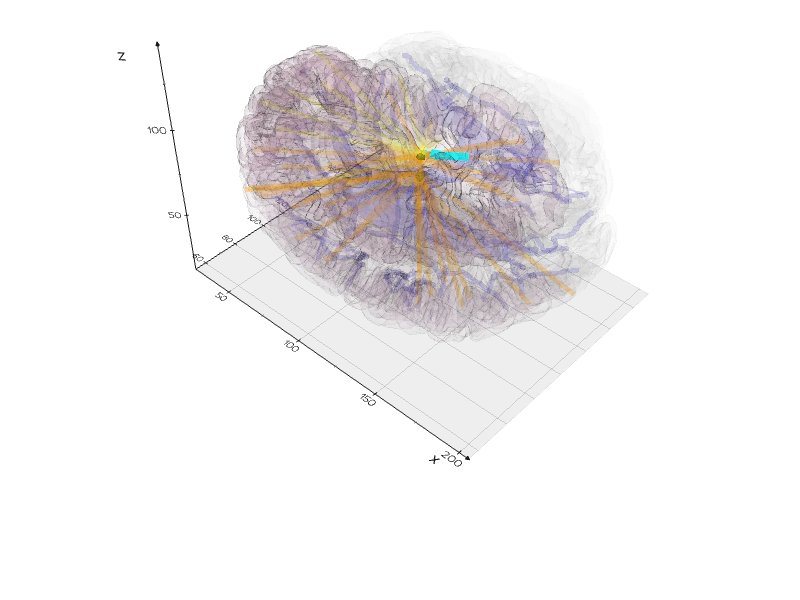

In [25]:
actors = []
if merged_full_brain: actors.append(merged_full_brain)

if selected_hemisphere == 'left':
    if merged_left_entry_zone:
        actors.append(merged_left_entry_zone.clone().alpha(0.08))
    if merged_right_entry_zone:
        actors.append(merged_right_entry_zone.clone().alpha(0.02))
    if merged_left_stn:
        actors.append(merged_left_stn.clone().alpha(0.9))
    if merged_right_stn:
        actors.append(merged_right_stn.clone().alpha(0.3))
elif selected_hemisphere == 'right':
    if merged_left_entry_zone:
        actors.append(merged_left_entry_zone.clone().alpha(0.02))
    if merged_right_entry_zone:
        actors.append(merged_right_entry_zone.clone().alpha(0.08))
    if merged_left_stn:
        actors.append(merged_left_stn.clone().alpha(0.3))
    if merged_right_stn:
        actors.append(merged_right_stn.clone().alpha(0.9))
else:
    if merged_left_entry_zone: actors.append(merged_left_entry_zone)
    if merged_right_entry_zone: actors.append(merged_right_entry_zone)
    if merged_left_stn: actors.append(merged_left_stn)
    if merged_right_stn: actors.append(merged_right_stn)

if merged_obstacles: actors.append(merged_obstacles)

actors.extend(failed_lines)
actors.extend(suboptimal_lines)
if best_path:
    mc_best_faded = best_path.clone().alpha(0.3)
    actors.append(mc_best_faded)

try:
    actors.append(nm_optimal_line)
except:
    print("Nelder-Mead optimized path not found.")

print(f"Rendering scene with optimized path (cyan)...")
show(actors, axes=1, viewup="z", 
     title=f"Optimized Path (w_obs={w_obstacle_norm:.2f}, w_len={w_path_length_norm:.2f})")


#### K3D

In [26]:
import k3d

# Helper function to convert vedo mesh to k3d mesh
def vedo_to_k3d_mesh(vedo_mesh, color=None, opacity_factor=1.0):
    vertices = np.array(vedo_mesh.vertices, dtype=np.float32)
    faces = np.array(vedo_mesh.cells, dtype=np.uint32)
    
    if color is None:
        vedo_color = vedo_mesh.color()
        if isinstance(vedo_color, str):
            import matplotlib.colors as mcolors
            if vedo_color in mcolors.CSS4_COLORS:
                color_hex = mcolors.CSS4_COLORS[vedo_color]
                color = int(color_hex.lstrip('#'), 16)
            else:
                color = 0x808080
        elif isinstance(vedo_color, (list, tuple, np.ndarray)):
            # Handle RGB tuples/arrays (values 0-1 or 0-255)
            rgb = np.asarray(vedo_color[:3])
            # Normalize to 0-255 range if needed
            if rgb.max() <= 1.0:
                rgb = (rgb * 255).astype(int)
            else:
                rgb = rgb.astype(int)
            r, g, b = int(rgb[0]), int(rgb[1]), int(rgb[2])
            color = (r << 16) | (g << 8) | b
        else:
            color = 0x808080
    
    vedo_alpha = vedo_mesh.alpha()
    if vedo_alpha is not None:
        opacity = float(vedo_alpha)
    else:
        opacity = 1.0
        
    opacity = np.clip(opacity * opacity_factor, 0.0, 1.0)
    
    return k3d.mesh(vertices, faces, color=color, opacity=opacity)

def vedo_line_to_k3d(vedo_line, color=None, width=0.1):
    line_scale_factor = 0.2
    points = np.array(vedo_line.vertices, dtype=np.float32)
    
    if color is None:
        vedo_color = vedo_line.color()
        if isinstance(vedo_color, str):
            import matplotlib.colors as mcolors
            if vedo_color in mcolors.CSS4_COLORS:
                color_hex = mcolors.CSS4_COLORS[vedo_color]
                color = int(color_hex.lstrip('#'), 16)
            else:
                color = 0x00FF00
        elif isinstance(vedo_color, (list, tuple, np.ndarray)):
            # Handle RGB tuples/arrays (values 0-1 or 0-255)
            rgb = np.asarray(vedo_color[:3])
            # Normalize to 0-255 range if needed
            if rgb.max() <= 1.0:
                rgb = (rgb * 255).astype(int)
            else:
                rgb = rgb.astype(int)
            r, g, b = int(rgb[0]), int(rgb[1]), int(rgb[2])
            color = (r << 16) | (g << 8) | b
        else:
            color = 0x00FF00
    
    return k3d.line(points, color=color, width=width * line_scale_factor)


In [ ]:
import k3d

## Plot optimization results with k3d
plot = k3d.plot(name=f'Optimized Path')

if merged_full_brain:
    plot += vedo_to_k3d_mesh(merged_full_brain)

if selected_hemisphere == 'left':
    print("Left hemisphere focused.")
    if merged_left_entry_zone:
        plot += vedo_to_k3d_mesh(merged_left_entry_zone, opacity_factor=2)
    if merged_right_entry_zone:
        plot += vedo_to_k3d_mesh(merged_right_entry_zone, opacity_factor=0.5)
    if merged_left_stn:
        plot += vedo_to_k3d_mesh(merged_left_stn, opacity_factor=1)
    if merged_right_stn:
        plot += vedo_to_k3d_mesh(merged_right_stn, opacity_factor=0.5)
elif selected_hemisphere == 'right':
    print("Right hemisphere focused.")
    if merged_left_entry_zone:
        plot += vedo_to_k3d_mesh(merged_left_entry_zone, opacity_factor=0.5)
    if merged_right_entry_zone:
        plot += vedo_to_k3d_mesh(merged_right_entry_zone, opacity_factor=2)
    if merged_left_stn:
        plot += vedo_to_k3d_mesh(merged_left_stn, opacity_factor=0.5)
    if merged_right_stn:
        plot += vedo_to_k3d_mesh(merged_right_stn, opacity_factor=1)
else:
    if merged_left_entry_zone:
        plot += vedo_to_k3d_mesh(merged_left_entry_zone)
    if merged_right_entry_zone:
        plot += vedo_to_k3d_mesh(merged_right_entry_zone)
    if merged_left_stn:
        plot += vedo_to_k3d_mesh(merged_left_stn)
    if merged_right_stn:
        plot += vedo_to_k3d_mesh(merged_right_stn)

if merged_obstacles:
    plot += vedo_to_k3d_mesh(merged_obstacles)

for line in failed_lines:
    plot += vedo_line_to_k3d(line, color=0xFF5F1F, width=FAILED_PATH_WIDTH * 0.5)
for line in suboptimal_lines:
    plot += vedo_line_to_k3d(line, color=0xFFFF00, width=SUBOPTIMAL_PATH_WIDTH * 0.5)
if best_path:
    plot += vedo_line_to_k3d(best_path, color=0x00FF00, width=BEST_PATH_WIDTH * 0.7)

try:
    plot += vedo_line_to_k3d(nm_optimal_line, color=0x00FFFF, width=BEST_PATH_WIDTH * 1.0)
except: 
    print("Nelder-Mead optimized path not found.")

print("Displaying optimization result with k3d...")
plot.display()
